### Anamoly Detection - WikiPedia Daily Traffic Dataset
We use below pytimetk anamoly functions to identify, analyze and clean anamolies

`tk.anomalize()`: A single function that integrates time series decomposition, anomaly identification (scoring), and outlier cleaning.

`tk.plot_anomalies_decomp()`: The first step towards identifying if your anomalization is detecting outliers to your needs.

`tk.plot_anomalies()`: The second step to visualize the anomalies.

`tk.plot_anomalies_cleaned()`: Compare the data with anomalies removed (before and after)

In [1]:
import pytimetk as tk
import pandas as pd
df = tk.load_dataset("wikipedia_traffic_daily", parse_dates = ['date'])

df.glimpse()

<class 'pandas.core.frame.DataFrame'>: 5500 rows of 3 columns
Page:   object            ['Death_of_Freddie_Gray_en.wikipedia.org_mobil ...
date:   datetime64[ns]    [Timestamp('2015-07-01 00:00:00'), Timestamp(' ...
value:  int64             [791, 704, 903, 732, 558, 504, 543, 1156, 1196 ...


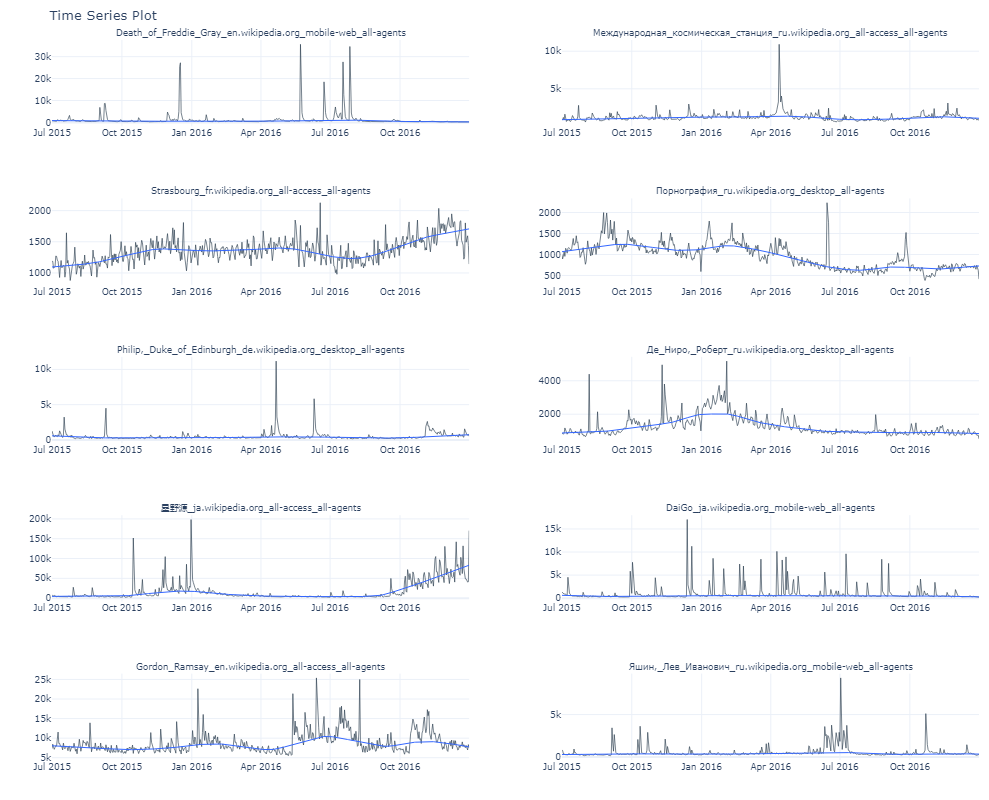

In [2]:
df \
    .groupby('Page') \
    .plot_timeseries(
        date_column = "date", 
        value_column = "value",
        facet_ncol = 2,
        width = 800,
        height = 800,
        engine = 'plotly'
    )

We can see there are some spikes, but are these anomalies?

##### Anamolize() Function
The anomalize() function is a feature rich tool for performing anomaly detection. Anomalize is group-aware, so we can use this as part of a normal pandas groupby chain. In one easy step:

We breakdown (decompose) the time series
Analyze it’s remainder (residuals) for spikes (anomalies)
Clean the anomalies if desired

In [3]:
anomalize_df = df \
    .groupby('Page', sort = False) \
    .anomalize(
        date_column = "date", 
        value_column = "value", 
    )

anomalize_df.glimpse()

Anomalizing...:   0%|          | 0/10 [00:00<?, ?it/s]

<class 'pandas.core.frame.DataFrame'>: 5500 rows of 13 columns
Page:               object            ['Death_of_Freddie_Gray_en.wikiped ...
date:               datetime64[ns]    [Timestamp('2015-07-01 00:00:00'), ...
observed:           int32             [791, 704, 903, 732, 558, 504, 543 ...
seasonal:           float16           [206.75, 4.04296875, 126.125, 66.5 ...
seasadj:            float32           [584.0, 700.0, 777.0, 665.5, 617.5 ...
trend:              float32           [729.0, 726.0, 723.0, 720.0, 717.0 ...
remainder:          float32           [-144.875, -26.09375, 53.78125, -5 ...
anomaly:            object            ['No', 'No', 'No', 'No', 'No', 'No ...
anomaly_score:      float32           [267.0, 148.25, 68.3125, 176.75, 2 ...
anomaly_direction:  int8              [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,  ...
recomposed_l1:      float32           [266.0, 60.3125, 179.5, 116.875, - ...
recomposed_l2:      float32           [1850.0, 1644.0, 1763.0, 1701.0, 1 ...
observed_clea

In [4]:
anomalize_df[anomalize_df['anomaly']=="Yes"].head()

,Page,date,observed,seasonal,seasadj,trend,remainder,anomaly,anomaly_score,anomaly_direction,recomposed_l1,recomposed_l2,observed_clean
22,Death_of_Freddie_Gray_en.wikipedia.org_mobile-...,2015-07-23,2862,-84.812500,2946.0,663.0,2284.0,Yes,2162.0,1,-91.81250,1492.0,1294.0
23,Death_of_Freddie_Gray_en.wikipedia.org_mobile-...,2015-07-24,3215,-29.109375,3244.0,660.0,2584.0,Yes,2462.0,1,-39.06250,1545.0,1347.0
63,Death_of_Freddie_Gray_en.wikipedia.org_mobile-...,2015-09-02,6870,-11.179688,6880.0,534.5,6348.0,Yes,6224.0,1,-146.50000,1437.0,1239.0
64,Death_of_Freddie_Gray_en.wikipedia.org_mobile-...,2015-09-03,3480,-22.437500,3502.0,530.5,2972.0,Yes,2850.0,1,-161.62500,1422.0,1224.0
69,Death_of_Freddie_Gray_en.wikipedia.org_mobile-...,2015-09-08,8621,102.250000,8520.0,512.5,8008.0,Yes,7884.0,1,-55.03125,1529.0,1331.0


The seasonal decomposition: observed, seasonal, seasadj, trend, and remainder. The objective is to remove trend and seasonality such that the remainder is stationary and representative of normal variation and anomalous variations.

Anomaly identification and scoring: anomaly, anomaly_score, anomaly_direction. These identify the anomaly decision (Yes/No), score the anomaly as a distance from the centerline, and label the direction (-1 (down), zero (not anomalous), +1 (up)).

Recomposition: recomposed_l1 and recomposed_l2. Think of these as the lower and upper bands. Any observed data that is below l1 or above l2 is anomalous.

Cleaned data: observed_clean. Cleaned data is automatically provided, which has the outliers replaced with data that is within the recomposed l1/l2 boundaries

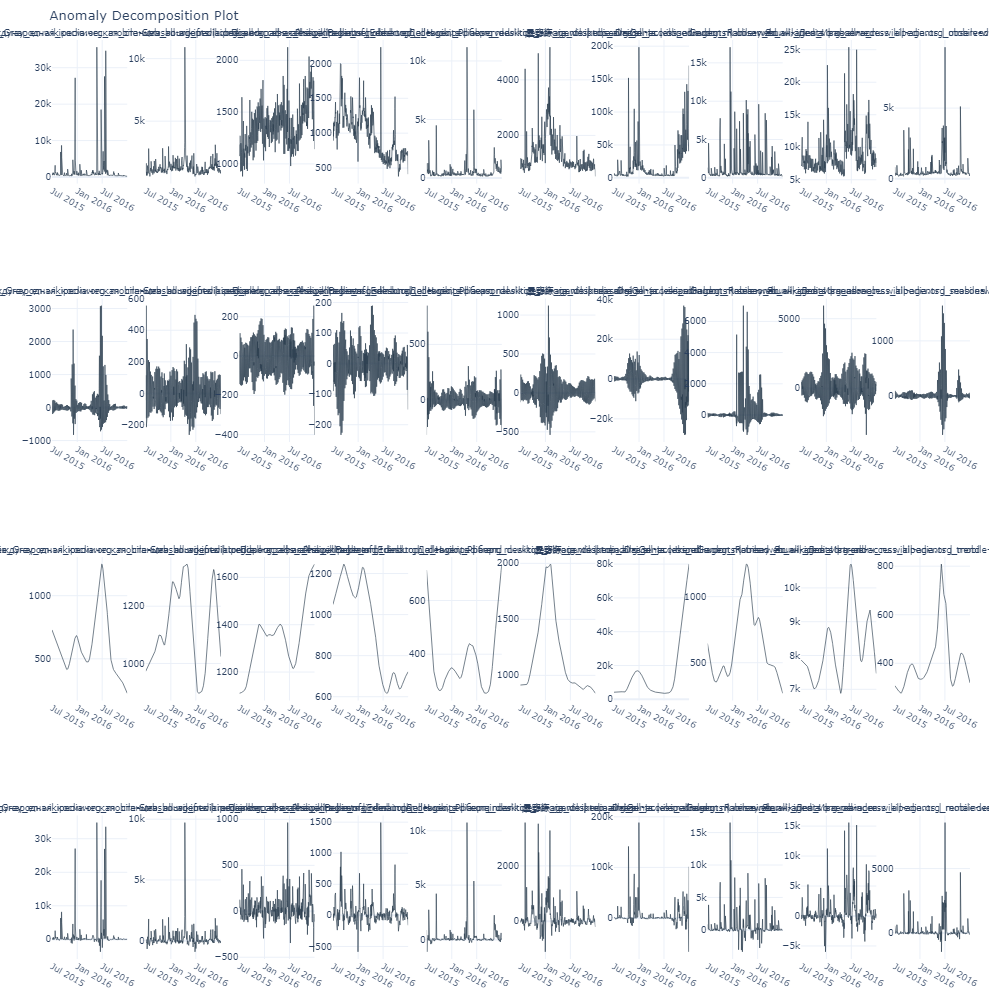

In [5]:
anomalize_df \
    .groupby("Page") \
    .plot_anomalies_decomp(
        date_column = "date",
        width = 1800,
        height = 1000,
        engine = 'plotly',
    )

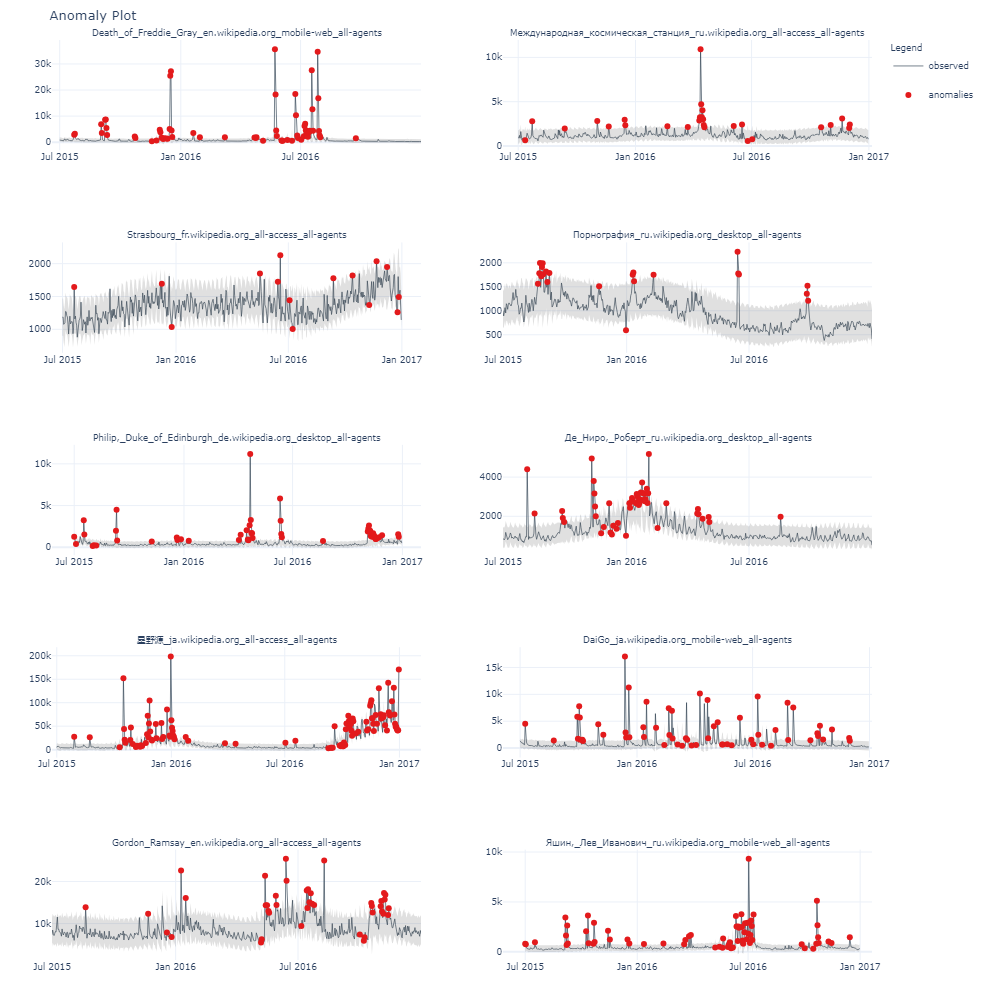

In [6]:
anomalize_df \
    .groupby("Page") \
    .plot_anomalies(
        date_column = "date", 
        facet_ncol = 2, 
        width = 1000,
        height = 1000,
    )

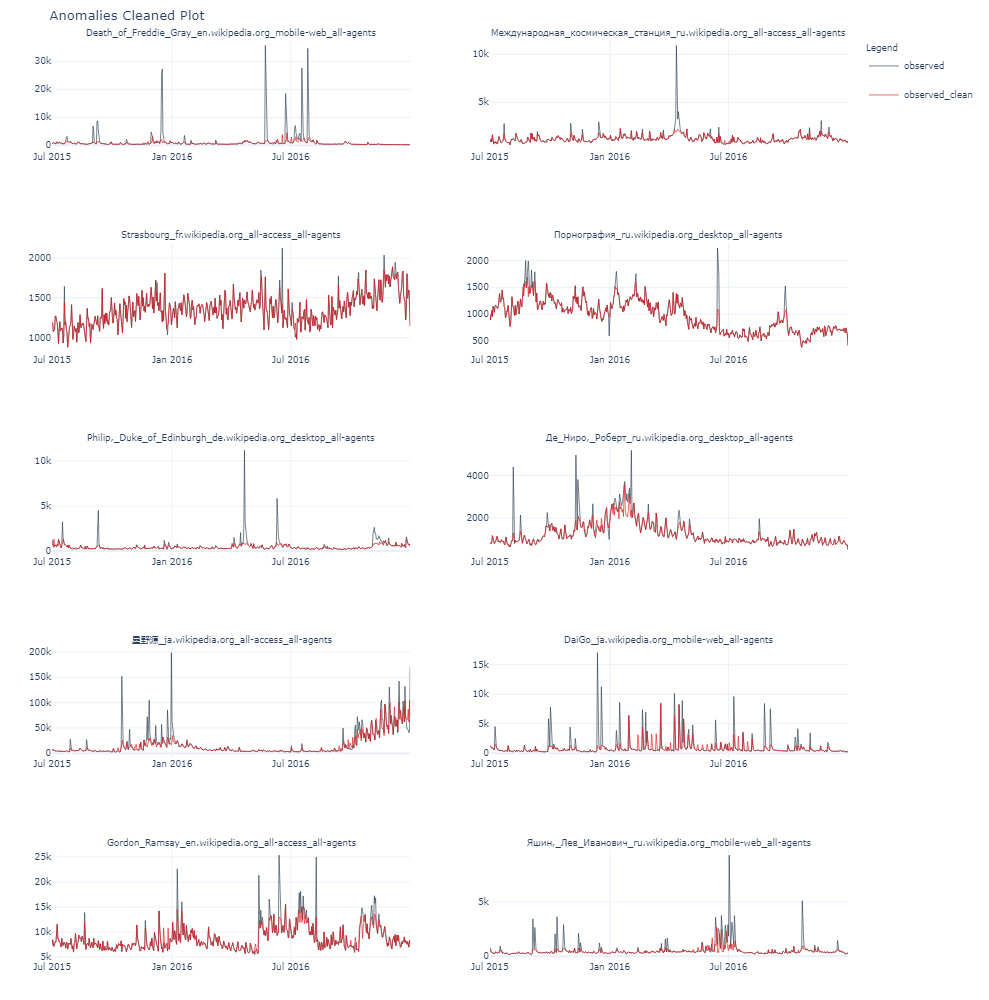

In [7]:
anomalize_df \
    .groupby("Page") \
    .plot_anomalies_cleaned(
        date_column = "date", 
        facet_ncol = 2, 
        width = 1000,
        height = 1000,
        engine = "plotly"
    )